In [21]:
import numpy as np 
import matplotlib.pyplot as plt 
from datasets import load_dataset


In [22]:
# test_answer_accs = np.load("/data/katie_kang/reasoning_data/data/MATH_aug/test_answer_types5.npy")==0
test_answer_accs = np.load("data/MATH_aug/test_answer_types5.npy")==0

hard_idxs = np.where(test_answer_accs.sum(axis=-1)==0)[0]






In [74]:
dataset = load_dataset("hendrycks/competition_math", cache_dir=None)
level5_idxs = np.where(np.array(dataset["test"]["level"])=='Level 5')[0]


/data/katie_kang/miniconda3/envs/trlx2/lib/python3.9/site-packages/datasets/load.py:1461: FutureWarning: The repository for hendrycks/competition_math contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/hendrycks/competition_math
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this dataset from the next major release of `datasets`.
  warnings.warn(


In [23]:
accs_5000 = []
NUM_TRAIN_POINTS=5000
for HARD_RATIO in [0, 0.25, 0.5, 0.75, 1]:
    EASY_RATIO=(1-HARD_RATIO)*0.35
    MEDIUM_RATIO=(1-HARD_RATIO)*0.65

    CKPT_NAME=f"math_aug_easy{EASY_RATIO:.2f}_medium{MEDIUM_RATIO:.2f}_hard{HARD_RATIO:.2f}_total{NUM_TRAIN_POINTS}"
    print(CKPT_NAME)
    print((np.load("ckpts/"+CKPT_NAME+"/test_answer_types5_seed2.npy")==0).mean(axis=-1)[hard_idxs].mean())
    accs_5000.append((np.load("ckpts/"+CKPT_NAME+"/test_answer_types5_seed2.npy")==0).max(axis=-1)[hard_idxs].mean())

math_aug_easy0.35_medium0.65_hard0.00_total5000
0.024233851956624235
math_aug_easy0.26_medium0.49_hard0.25_total5000
0.029420084865629418
math_aug_easy0.17_medium0.33_hard0.50_total5000
0.030174446016030174
math_aug_easy0.09_medium0.16_hard0.75_total5000
0.030080150872230083
math_aug_easy0.00_medium0.00_hard1.00_total5000
0.029231494578029232


In [24]:
accs_20000 = []
NUM_TRAIN_POINTS=20000
for HARD_RATIO in [0, 0.25, 0.5, 0.75, 1]:
    EASY_RATIO=(1-HARD_RATIO)*0.35
    MEDIUM_RATIO=(1-HARD_RATIO)*0.65

    CKPT_NAME=f"math_aug_easy{EASY_RATIO:.2f}_medium{MEDIUM_RATIO:.2f}_hard{HARD_RATIO:.2f}_total{NUM_TRAIN_POINTS}"
    print(CKPT_NAME)
    print((np.load("ckpts/"+CKPT_NAME+"/test_answer_types5_seed2.npy")==0).mean(axis=-1)[hard_idxs].mean())
    accs_20000.append((np.load("ckpts/"+CKPT_NAME+"/test_answer_types5_seed2.npy")==0).max(axis=-1)[hard_idxs].mean())

math_aug_easy0.35_medium0.65_hard0.00_total20000
0.042432814710042434
math_aug_easy0.26_medium0.49_hard0.25_total20000
0.044695898161244696
math_aug_easy0.17_medium0.33_hard0.50_total20000
0.05063649222065064
math_aug_easy0.09_medium0.16_hard0.75_total20000
0.0462989156058463
math_aug_easy0.00_medium0.00_hard1.00_total20000
0.04262140499764262


In [25]:
accs_40000 = []
NUM_TRAIN_POINTS=40000
for HARD_RATIO in [0.25, 0.5, 0.75, 1]:
    EASY_RATIO=(1-HARD_RATIO)*0.35
    MEDIUM_RATIO=(1-HARD_RATIO)*0.65

    CKPT_NAME=f"math_aug_easy{EASY_RATIO:.2f}_medium{MEDIUM_RATIO:.2f}_hard{HARD_RATIO:.2f}_total{NUM_TRAIN_POINTS}"
    print(CKPT_NAME)
    print((np.load("ckpts/"+CKPT_NAME+"/test_answer_types5_seed2.npy")==0).mean(axis=-1)[hard_idxs].mean())
    accs_40000.append((np.load("ckpts/"+CKPT_NAME+"/test_answer_types5_seed2.npy")==0).max(axis=-1)[hard_idxs].mean())

math_aug_easy0.26_medium0.49_hard0.25_total40000
0.05516265912305516
math_aug_easy0.17_medium0.33_hard0.50_total40000
0.05478547854785479
math_aug_easy0.09_medium0.16_hard0.75_total40000
0.05469118340405469
math_aug_easy0.00_medium0.00_hard1.00_total40000
0.04611032531824612


Text(0.5, 1.0, 'MATH Hard (train acc 0)')

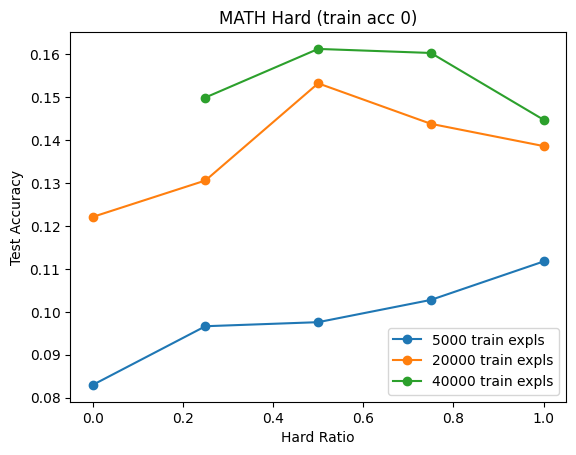

In [26]:
plt.plot([0, 0.25, 0.5, 0.75, 1], accs_5000, "o-", label="5000 train expls")
plt.plot([0, 0.25, 0.5, 0.75, 1], accs_20000, "o-",label="20000 train expls")
plt.plot([0.25, 0.5, 0.75, 1], accs_40000, "o-",label="40000 train expls")
plt.legend()
plt.xlabel("Hard Ratio")
plt.ylabel("Test Accuracy")
# plt.savefig("delete2.jpg")
plt.title("MATH Hard (train acc 0)")

In [132]:
NUM_TRAIN_POINTS=20000
HARD_RATIO= 0.75
EASY_RATIO=(1-HARD_RATIO)*0.35
MEDIUM_RATIO=(1-HARD_RATIO)*0.65

CKPT_NAME=f"math_aug_easy{EASY_RATIO:.2f}_medium{MEDIUM_RATIO:.2f}_hard{HARD_RATIO:.2f}_total{NUM_TRAIN_POINTS}"
print(CKPT_NAME)
print((np.load("../ckpts/"+CKPT_NAME+"/checkpoint-4000/test_answer_types5_seed2.npy")==0).mean(axis=-1)[hard_idxs].mean())

math_aug_easy0.09_medium0.16_hard0.75_total20000
0.030834512022630836


In [131]:
NUM_TRAIN_POINTS=20000
HARD_RATIO= 0.75
EASY_RATIO=(1-HARD_RATIO)*0.35
MEDIUM_RATIO=(1-HARD_RATIO)*0.65

CKPT_NAME=f"math_aug_easy{EASY_RATIO:.2f}_medium{MEDIUM_RATIO:.2f}_hard{HARD_RATIO:.2f}_total{NUM_TRAIN_POINTS}"
print(CKPT_NAME)
print((np.load("../ckpts/"+CKPT_NAME+"/checkpoint-6000/test_answer_types5_seed2.npy")==0).mean(axis=-1)[hard_idxs].mean())

math_aug_easy0.09_medium0.16_hard0.75_total20000
0.042055634134842056


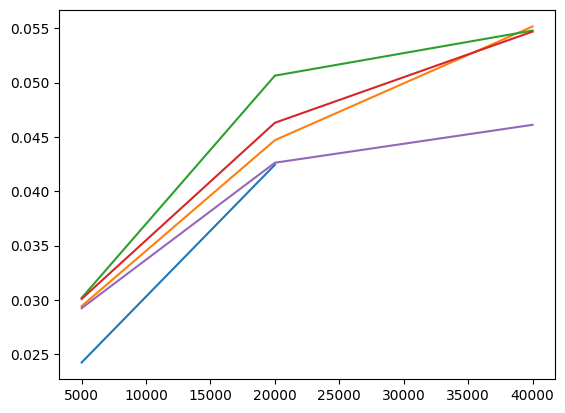

In [20]:
for HARD_RATIO in [0]:
    accs = []
    for NUM_TRAIN_POINTS in [5000, 20000]:
        EASY_RATIO=(1-HARD_RATIO)*0.35
        MEDIUM_RATIO=(1-HARD_RATIO)*0.65

        CKPT_NAME=f"math_aug_easy{EASY_RATIO:.2f}_medium{MEDIUM_RATIO:.2f}_hard{HARD_RATIO:.2f}_total{NUM_TRAIN_POINTS}"
        accs.append((np.load("ckpts/"+CKPT_NAME+"/test_answer_types5_seed2.npy")==0).mean(axis=-1)[hard_idxs].mean())
    
    plt.plot([5000, 20000], accs, label=f"hard ratio {HARD_RATIO}")

for HARD_RATIO in [ 0.25, 0.5, 0.75, 1]:
    accs = []
    for NUM_TRAIN_POINTS in [5000, 20000, 40000]:
        EASY_RATIO=(1-HARD_RATIO)*0.35
        MEDIUM_RATIO=(1-HARD_RATIO)*0.65

        CKPT_NAME=f"math_aug_easy{EASY_RATIO:.2f}_medium{MEDIUM_RATIO:.2f}_hard{HARD_RATIO:.2f}_total{NUM_TRAIN_POINTS}"
        accs.append((np.load("ckpts/"+CKPT_NAME+"/test_answer_types5_seed2.npy")==0).mean(axis=-1)[hard_idxs].mean())
    
    plt.plot([5000, 20000, 40000], accs, label=f"hard ratio {HARD_RATIO}")


plt.savefig("delete2.jpg")

In [70]:

train_num_correct = (np.concatenate([np.load("../data/MATH_aug/train_aug_1_answer_types5_seed2.npy"), np.load("../data/MATH_aug/train_aug_2_answer_types5_seed2.npy")], axis=0)==0).sum(axis=-1)
hard_train_idxs = np.where(train_num_correct==0)[0]

In [78]:
import json
with open('../data/MATH_aug/AugMATH_part1.jsonl', 'r') as json_file:
    json_list = list(json_file)

with open('../data/MATH_aug/AugMATH_part2.jsonl', 'r') as json_file:
    json_list += list(json_file)

train_questions = []
train_answers = []
for json_str in json_list:
    result = json.loads(json_str)
    train_questions.append(result["query"])
    train_answers.append(result["response"])
    
train_questions = np.array(train_questions)
train_answers = np.array(train_answers)

In [108]:
NUM_TRAIN_POINTS=20000
HARD_RATIO = 1
EASY_RATIO=(1-HARD_RATIO)*0.35
MEDIUM_RATIO=(1-HARD_RATIO)*0.65


CKPT_NAME=f"math_aug_easy{EASY_RATIO:.2f}_medium{MEDIUM_RATIO:.2f}_hard{HARD_RATIO:.2f}_total{NUM_TRAIN_POINTS}"

# subsample_idxs = np.load("../ckpts/"+CKPT_NAME+"/subsample_idxs.npy")[:5000]

# hard_subsample = np.where(np.isin(subsample_idxs, hard_train_idxs))[0]
# print(len(hard_subsample))
# print(CKPT_NAME)
# print((np.load("../ckpts/"+CKPT_NAME+"/train_aug_subsample_answer_types5_seed2.npy")==0).mean(axis=-1)[hard_subsample].mean())

subsample_idxs = np.load("../ckpts/"+CKPT_NAME+"/subsample_idxs.npy")[:5000]
train_correct = np.load("../ckpts/"+CKPT_NAME+"/train_aug_subsample_answer_types5_seed2.npy")==0
train_samples = np.load("../ckpts/"+CKPT_NAME+"/train_aug_subsample_answers5_seed2.npy")


incorrect = 0
exact_match = 0
correct_different = 0
for input_idx in range(5000):
    for sample_idx in range(5):
        correct = train_correct[input_idx, sample_idx]
        if correct:
            # print(input_idx)
            # print(train_samples[input_idx][sample_idx].strip() == train_answers[subsample_idxs[input_idx]].strip())
            # print(train_answers[subsample_idxs[input_idx]])
            if train_samples[input_idx][sample_idx].strip() == train_answers[subsample_idxs[input_idx]].strip():
                exact_match+=1
            else:
                correct_different+=1
                print(input_idx)
                print(train_samples[input_idx][sample_idx])
                print(train_answers[subsample_idxs[input_idx]])
                print("\n")
        else:
            incorrect+=1

2
  The number $x$ is equal to $2^23^34^45^56^67^78^89^9$.
We can simplify this expression by writing each power as a product:
\[x = 2^23^3(2^2)^45^5(2\cdot3)^67^7(2^3)^89^9 = 2^{2+8+16+24}3^{3+6+9}5^57^79^9 = 2^{48}3^{18}5^57^79^9.\]
Now, we multiply $x$ by $1.5$:
\[1.5x = 2^{48}3^{18}5^57^79^9 \cdot 1.5 = 2^{48}3^{18}5^57^79^9 \cdot \frac{3}{2} = 2^{48}3^{18+1}5^57^79^9 = 2^{48}3^{19}5^57^79^9.\]
To make this a perfect square, we need to multiply it by a number that will make all the exponents even.
The smallest positive integer that will do this is $2 \cdot 3 \cdot 5 \cdot 7 \cdot 9 = 1890$.
Therefore, the smallest positive integer that, when multiplied with the new value of $x$, produces a product that is a perfect square is 1890. The answer is: $1890$
 The number $x$ is equal to $2^23^34^45^56^67^78^89^9$.
We can simplify this expression as follows:
\[x = 2^23^3(2^2)^45^5(2\cdot3)^67^7(2^3)^89^9 = 2^{2+8+16+24}3^{3+6+9}5^57^79^9 = 2^{48}3^{18}5^57^79^9.\]
Now, we multiply $x$ by $

In [109]:
print("incorrect: ", incorrect/(incorrect+exact_match+correct_different))
print("exact_match: ", exact_match/(incorrect+exact_match+correct_different))
print("correct_different: ", correct_different/(incorrect+exact_match+correct_different))

incorrect:  0.31668
exact_match:  0.5496
correct_different:  0.13372


In [94]:
len(exact_match)

17083

In [106]:
NUM_TRAIN_POINTS=20000
HARD_RATIO = 0.25
EASY_RATIO=(1-HARD_RATIO)*0.35
MEDIUM_RATIO=(1-HARD_RATIO)*0.65


CKPT_NAME=f"math_aug_easy{EASY_RATIO:.2f}_medium{MEDIUM_RATIO:.2f}_hard{HARD_RATIO:.2f}_total{NUM_TRAIN_POINTS}"

# subsample_idxs = np.load("../ckpts/"+CKPT_NAME+"/subsample_idxs.npy")[:5000]

# hard_subsample = np.where(np.isin(subsample_idxs, hard_train_idxs))[0]
# print(len(hard_subsample))
# print(CKPT_NAME)
# print((np.load("../ckpts/"+CKPT_NAME+"/train_aug_subsample_answer_types5_seed2.npy")==0).mean(axis=-1)[hard_subsample].mean())

subsample_idxs = np.load("../ckpts/"+CKPT_NAME+"/subsample_idxs.npy")[:5000]
train_correct = np.load("../ckpts/"+CKPT_NAME+"/train_aug_subsample_answer_types5_seed2.npy")==0
train_samples = np.load("../ckpts/"+CKPT_NAME+"/train_aug_subsample_answers5_seed2.npy")
hard_subsample = np.where(np.isin(subsample_idxs, hard_train_idxs))[0]

incorrect = 0
exact_match = 0
correct_different = 0
for input_idx in hard_subsample:
    for sample_idx in range(5):
        correct = train_correct[input_idx, sample_idx]
        if correct:
            # print(input_idx)
            # print(train_samples[input_idx][sample_idx].strip() == train_answers[subsample_idxs[input_idx]].strip())
            # print(train_answers[subsample_idxs[input_idx]])
            # exact_match.append(train_samples[input_idx][sample_idx].strip() == train_answers[subsample_idxs[input_idx]].strip())
            if train_samples[input_idx][sample_idx].strip() == train_answers[subsample_idxs[input_idx]].strip():
                exact_match+=1
            else:
                correct_different+=1
                print(input_idx)
                print(train_samples[input_idx][sample_idx])
                print(train_answers[subsample_idxs[input_idx]])
                print("\n")
        else:
            incorrect+=1

4
  First, we can rearrange the terms in the expression in descending order of their degree:
\[(2+8-14) + (-4x+10x+16x) + (-6x^2-12x^2+18x^2).\]
This simplifies to:
\[-4 + 22x + 0x^2.\]
The $0x^2$ term can be dropped, so the expression simplifies further to:
\[-4 + 22x.\]
Since $x>0$, we can substitute a positive value for $x$. Let's say $x=1$ for simplicity. Then the expression becomes:
\[-4 + 22(1) = -4 + 22 = 18.\]
So the value of the expression when $x>0$ is 18. The answer is: $18$
 First, we can rearrange the terms in the expression to group together the like terms:
\[(2+8-14) + (-4x+10x+16x) + (-6x^2-12x^2+18x^2).\]
This simplifies to:
\[-4 + 22x + 0x^2.\]
The $0x^2$ term can be dropped, so the expression simplifies further to:
\[-4 + 22x.\]
Since $x>0$, we can substitute a positive value for $x$. Let's say $x=1$ for simplicity. Then the expression becomes:
\[-4 + 22(1) = -4 + 22 = 18.\]
So the value of the expression when $x>0$ is 18. The answer is: $18$


4
  First, we can rear

In [107]:
print("incorrect: ", incorrect/(incorrect+exact_match+correct_different))
print("exact_match: ", exact_match/(incorrect+exact_match+correct_different))
print("correct_different: ", correct_different/(incorrect+exact_match+correct_different))

incorrect:  0.5860501567398119
exact_match:  0.24153605015673982
correct_different:  0.1724137931034483


In [104]:
(1-np.array(exact_match)).mean()

0.4165088981446422

In [97]:
len(exact_match)

2641

In [73]:
NUM_TRAIN_POINTS=20000
for HARD_RATIO in [0.25, 1]:
    EASY_RATIO=(1-HARD_RATIO)*0.35
    MEDIUM_RATIO=(1-HARD_RATIO)*0.65


    CKPT_NAME=f"math_aug_easy{EASY_RATIO:.2f}_medium{MEDIUM_RATIO:.2f}_hard{HARD_RATIO:.2f}_total{NUM_TRAIN_POINTS}"
    
    subsample_idxs = np.load("../ckpts/"+CKPT_NAME+"/subsample_idxs.npy")[:5000]
    
    hard_subsample = np.where(np.isin(subsample_idxs, hard_train_idxs))[0]
    print(len(hard_subsample))
    print(CKPT_NAME)
    print((np.load("../ckpts/"+CKPT_NAME+"/train_aug_subsample_answer_types5_seed2.npy")==0).mean(axis=-1)[hard_subsample].mean())

1276
math_aug_easy0.26_medium0.49_hard0.25_total20000
0.41394984326018813
5000
math_aug_easy0.00_medium0.00_hard1.00_total20000
0.6833199999999999
